In [1]:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt

import h5py, os

from jaxpm.painting import cic_paint, cic_read, compensate_cic
from jaxpm.utils import power_spectrum
from jaxpm.utils import _initialize_pk
from jaxpm.pm import linear_field, lpt, make_ode_fn, pm_forces
from jaxpm.kernels import fftk, gradient_kernel, invlaplace_kernel, longrange_kernel

jax.devices("gpu")

[cuda(id=0)]

In [2]:
def cross_correlation(field1, field2, kmin=5, dk=0.5, boxsize=False):
  shape = field1.shape
  nx, ny, nz = shape

  #initialze values related to powerspectra (mode bins and weights)
  dig, Nsum, xsum, W, k, kedges = _initialize_pk(shape, boxsize, kmin, dk)

  #fast fourier transform
  fft_image1 = jnp.fft.fftn(field1)
  fft_image2 = jnp.fft.fftn(field2)

  #absolute value of fast fourier transform
  pk = jnp.real(fft_image1 * jnp.conj(fft_image2))

  #calculating powerspectra
  real = jnp.real(pk).reshape([-1])
  imag = jnp.imag(pk).reshape([-1])

  Psum = jnp.bincount(dig, weights=(W.flatten() * imag), length=xsum.size) * 1j
  Psum += jnp.bincount(dig, weights=(W.flatten() * real), length=xsum.size)

  P = ((Psum / Nsum)[1:-1] * boxsize.prod()).astype('float32')

  #normalization for powerspectra
  norm = np.prod(np.array(shape[:])).astype('float32')**2

  #find central values of each bin
  kbins = kedges[:-1] + (kedges[1:] - kedges[:-1]) / 2

  return kbins, P / norm


def gaussian_kernel(kvec, k_smooth):
  """
  Computes a gaussian kernel
  """
  kk = sum(ki**2 for ki in kvec)
  return jnp.exp(-0.5 * kk / k_smooth**2)

In [3]:
# This will define the mesh size we use to make 3d density maps 
# Note that the physical size of the volume is 25 Mpc/h on the side
# so one voxel is 25/128 Mpc/h on the side
mesh_shape = [128,128,128]

## Loading the snapshots

In [4]:
%%time
SIM = "/cluster/work/refregier/athomsen/flatiron/CAMELS/Sims/IllustrisTNG/CV/CV_0/snapshot_066.hdf5"

# First, the full hydro run
data         = h5py.File(SIM, 'r')
BoxSize      = data['Header'].attrs[u'BoxSize']/1e3    #size of the snapshot in comoving Mpc/h
redshift     = data['Header'].attrs[u'Redshift']       #reshift of the snapshot
scale_factor = data['Header'].attrs[u'Time']           #scale factor
h            = data['Header'].attrs[u'HubbleParam']    #value of the hubble parameter in 100 km/s/(Mpc/h)
Masses       = data['Header'].attrs[u'MassTable']*1e10 #masses of the particles in Msun/h
Np           = data['Header'].attrs[u'NumPart_Total']  #total number of particles for specie
Omega_m      = data['Header'].attrs[u'Omega0']
Omega_L      = data['Header'].attrs[u'OmegaLambda']
Omega_b      = data['Header'].attrs[u'OmegaBaryon']

# Loading the DM particles
hydro_dm_pos = data['PartType1/Coordinates'][:]/1e3  #Mpc/h
hydro_dm_pos = (hydro_dm_pos/BoxSize*mesh_shape[0])   #Rescaling positions to grid coordinates
hydro_dm_rho = cic_read(cic_paint(jnp.zeros(mesh_shape), hydro_dm_pos), hydro_dm_pos) # computing density

# Loading the gas particles
hydro_gas_pos  = data['PartType0/Coordinates'][:]/1e3 #Mpc/h
hydro_gas_pos = (hydro_gas_pos/BoxSize*mesh_shape[0]) #Rescaling positions to grid coordinates
hydro_gas_mass = data['PartType0/Masses'][:]*1e10     #Msun/h 
hydro_gas_rho = data['/PartType0/Density'][:]*1e10 * (1e3)**3 #(Msun/h)/(Mpc/h)^3
hydro_gas_U   = data['/PartType0/InternalEnergy'][:]  #(km/s)^2
hydro_gas_ne  = data['/PartType0/ElectronAbundance'][:]
# Derive pressure
gamma = 5.0/3.0
hydro_gas_P = (gamma-1.0)*hydro_gas_U*hydro_gas_rho #units are (Msun/h)*(km/s)^2/(Mpc/h)^3
# And temperature
yhelium = 0.0789
BOLTZMANN  = 1.38065e-16         #erg/K - NIST 2010
PROTONMASS = 1.67262178e-24      #gram  - NIST 2010
hydro_gas_T = hydro_gas_U*(1.0 + 4.0*yhelium)/(1.0 + yhelium + hydro_gas_ne)*1e10*(2.0/3.0)
hydro_gas_T *= (PROTONMASS/BOLTZMANN)
data.close()
# Utility functions from the CAMELS library https://github.com/franciscovillaescusa/CAMELS/blob/master/library/camels_library.py

# Computing total rho and fscalar
hydro_tot_rho = cic_paint(jnp.zeros(mesh_shape), hydro_dm_pos)
hydro_tot_rho = cic_paint(hydro_tot_rho, hydro_gas_pos, 
                                weight=hydro_gas_mass/Masses[1])

hydro_dm_rhotot = cic_read(hydro_tot_rho, hydro_dm_pos)
hydro_gas_rhotot = cic_read(hydro_tot_rho, hydro_gas_pos)

# And compute this scalar force 
kvec = fftk(mesh_shape)
delta_k = jnp.fft.rfftn(hydro_tot_rho)
kk = sum(ki**2 for ki in kvec)
kk[kk == 0] = 1.
delta_k = delta_k / jnp.sqrt(kk)

hydro_dm_fscalar = cic_read(jnp.fft.irfftn(delta_k), hydro_dm_pos)
hydro_gas_fscalar = cic_read(jnp.fft.irfftn(delta_k), hydro_gas_pos)

2024-11-11 17:20:54.195054: W external/xla/xla/service/gpu/nvptx_compiler.cc:760] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


CPU times: user 3.42 s, sys: 1.76 s, total: 5.18 s
Wall time: 7.86 s


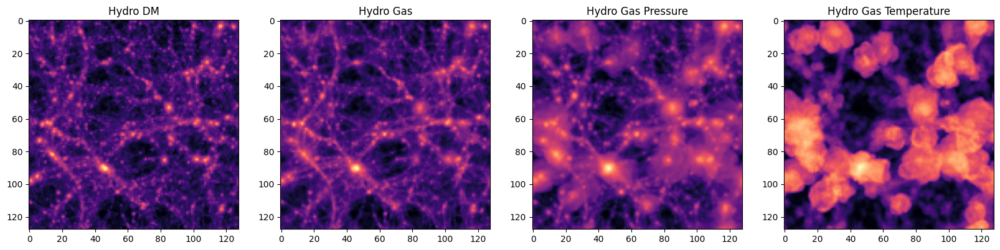

In [5]:
plt.figure(figsize=[20,5])
plt.subplot(141)
plt.title('Hydro DM')
im1 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_dm_pos).sum(axis=0)), cmap='magma')
# plt.colorbar(im1)
plt.subplot(142)
im2 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos).sum(axis=0)), cmap='magma')
plt.title('Hydro Gas')
plt.subplot(143)
im3 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_P/hydro_gas_rho).sum(axis=0)), cmap='magma')
plt.title('Hydro Gas Pressure');
plt.subplot(144)
im4 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_T/hydro_gas_rho).sum(axis=0)), cmap='magma')
plt.title('Hydro Gas Temperature');

Ok, so the questions that I'm curious about is to see whether the information about fscalar and rho is enough to predict the gas pressure and temperature, in principle.

## Testing correspondance between local environment and P/T

In [6]:
# %load_ext tensorboard
import jax
import jax.numpy as jnp
import tqdm
import optax
import flax.linen as nn
# from flax.metrics import tensorboard

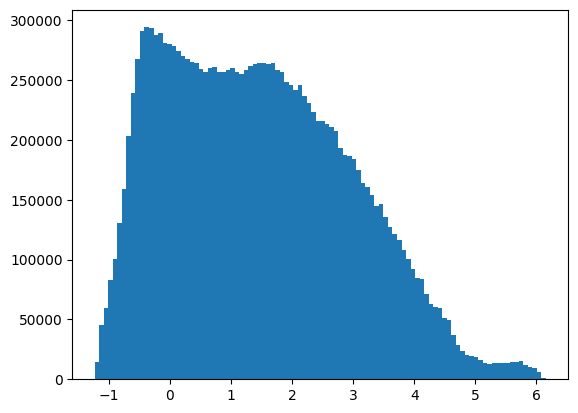

In [7]:
plt.hist(np.arcsinh(np.array(hydro_gas_fscalar)/100), 100);

In [8]:
from sklearn.preprocessing import StandardScaler

# Assembling the data
data = jnp.stack([np.log10(hydro_gas_rhotot),np.arcsinh(hydro_gas_fscalar/100), np.log10(hydro_gas_P), np.log10(hydro_gas_T)], axis=-1)
data_scaler = StandardScaler()
output_scaler = StandardScaler()
output_scaler = output_scaler.fit(data[:,2:])
data = data_scaler.fit_transform(data)

In [9]:
class HydroModel(nn.Module):
  @nn.compact
  def __call__(self, x):
    net = nn.leaky_relu(nn.Dense(512)(x))
    net = nn.leaky_relu(nn.Dense(512)(net))
    net = nn.leaky_relu(nn.Dense(512)(net))
    net = nn.leaky_relu(nn.Dense(512)(net))
    return nn.Dense(2)(net)

In [10]:
# Random seed for sampling from posterior
seed = jax.random.PRNGKey(0)

# Let's instantiate and initialize the model
model = HydroModel()
params = model.init(jax.random.PRNGKey(42), jnp.zeros(shape=[1, 2]))

# Define a scheduler for the leaerning rate
total_steps = 50_000
lr_scheduler = optax.piecewise_constant_schedule(init_value=0.001,
                  boundaries_and_scales={int(total_steps*0.3):0.2,
                                         int(total_steps*0.6):0.1,})

# Initializes an optimizer and optimizer state
optimizer = optax.adam(learning_rate=lr_scheduler)
opt_state = optimizer.init(params)

# summary_writer = tensorboard.SummaryWriter('logs/mse_test4')

In [11]:
# Define a simple MSE regression loss 
def loss_fn(params, batch):
    return jnp.mean(jnp.sum((model.apply(params, batch['x']) - batch['y'])**2,axis=-1))

@jax.jit
def update_model(params,  opt_state, batch):
  # Computes the gradients of the model
  loss, grads = jax.value_and_grad(loss_fn)(params, batch)

  # Computes the weights updates and apply them
  updates, opt_state = optimizer.update(grads, opt_state)
  params = optax.apply_updates(params, updates)

  return params, opt_state, loss

In [12]:
# %tensorboard --logdir=.

In [13]:
for i in tqdm.tqdm(range(total_steps)):
  inds = np.random.choice(len(data), 1024)
  batch = {'x': data[inds,0:2], 'y': data[inds,2:]}
  
  # Apply the update function
  params, opt_state, loss = update_model(params, opt_state, batch)
  # Periodically exporting the value of the loss function, every 100 steps
  # if i %100 ==0:
  #    summary_writer.scalar('train_loss', loss, i)
  #    summary_writer.scalar('learning_rate', lr_scheduler(i), i)

100%|██████████| 50000/50000 [00:29<00:00, 1720.60it/s]


In [14]:
# Let's test on the remaining examples
inds = np.random.choice(len(data), 50000)
x_test = data[inds,0:2]
y_test = data[inds,2:]
pred = model.apply(params, x_test)

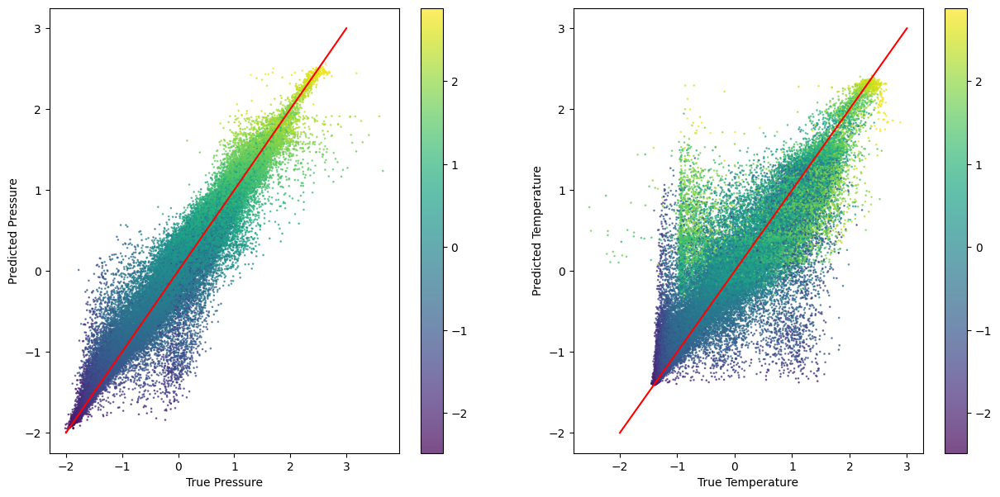

In [15]:
plt.figure(figsize=[15,7])
plt.subplot(121)
sc1 = plt.scatter(y_test[:,0], pred[:,0], c=x_test[:,0], s=0.75,alpha=0.7)
plt.colorbar(sc1)
plt.xlabel('True Pressure')
plt.ylabel('Predicted Pressure')
plt.plot([-2,3],[-2,3],color='r')
plt.subplot(122)
sc2 = plt.scatter(y_test[:,1], pred[:,1], c=x_test[:,0], s=0.75,alpha=0.7)
plt.colorbar(sc2)
plt.xlabel('True Temperature')
plt.ylabel('Predicted Temperature')
plt.plot([-2,3],[-2,3],color='r')

(-2.5, 3.0)

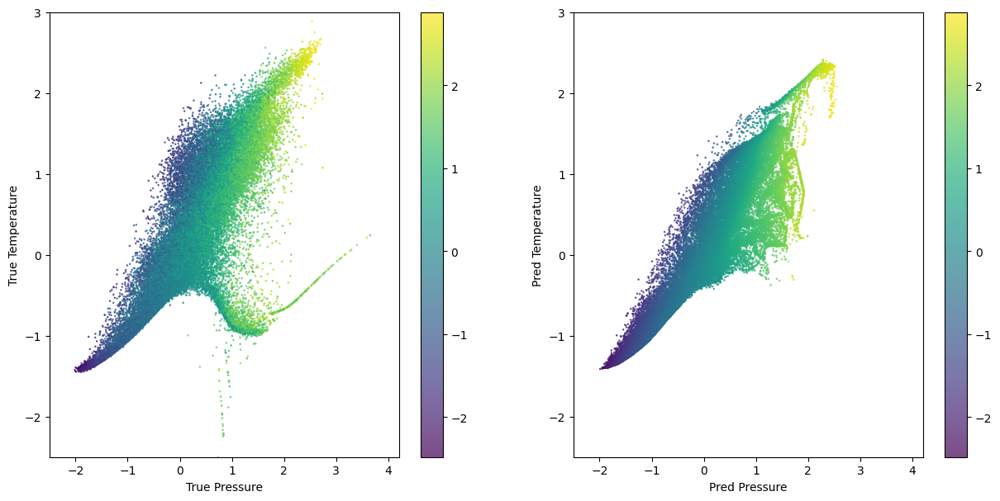

In [16]:
plt.figure(figsize=[15,7])
plt.subplot(121)
sc1 = plt.scatter(y_test[:,0], y_test[:,1], c=x_test[:,0], s=0.75,alpha=0.7)
plt.colorbar(sc1)
# scatter(pred[:,0], pred[:,1], c='red', s=0.75,alpha=0.7);
plt.xlabel('True Pressure')
plt.ylabel('True Temperature')
plt.xlim(-2.5, 4.2)
plt.ylim(-2.5, 3)
plt.subplot(122)
sc2 = plt.scatter(pred[:,0], pred[:,1], c=x_test[:,0], s=0.75,alpha=0.7)
plt.colorbar(sc2)
plt.xlabel('Pred Pressure')
plt.ylabel('Pred Temperature')
plt.xlim(-2.5, 4.2)
plt.ylim(-2.5, 3)

Text(0, 0.5, 'fscalar')

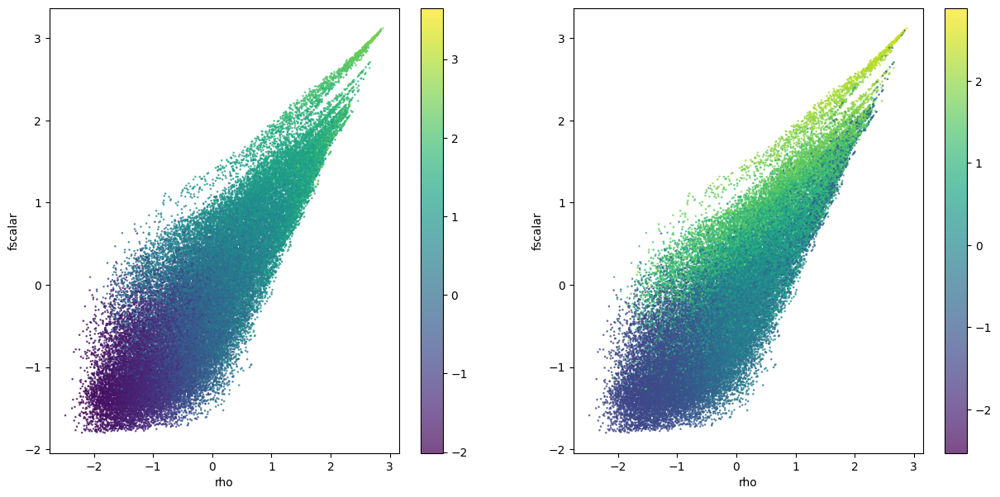

In [17]:
plt.figure(figsize=[15,7])
plt.subplot(121)
sc1 = plt.scatter(x_test[:,0], x_test[:,1], c=y_test[:,0], s=0.75,alpha=0.7)
plt.colorbar(sc1)
# scatter(pred[:,0], pred[:,1], c='red', s=0.75,alpha=0.7);
plt.xlabel('rho')
plt.ylabel('fscalar')
plt.subplot(122)
sc2 = plt.scatter(x_test[:,0], x_test[:,1], c=y_test[:,1], s=0.75,alpha=0.7)
plt.colorbar(sc2)
plt.xlabel('rho')
plt.ylabel('fscalar')

Text(0, 0.5, 'fscalar')

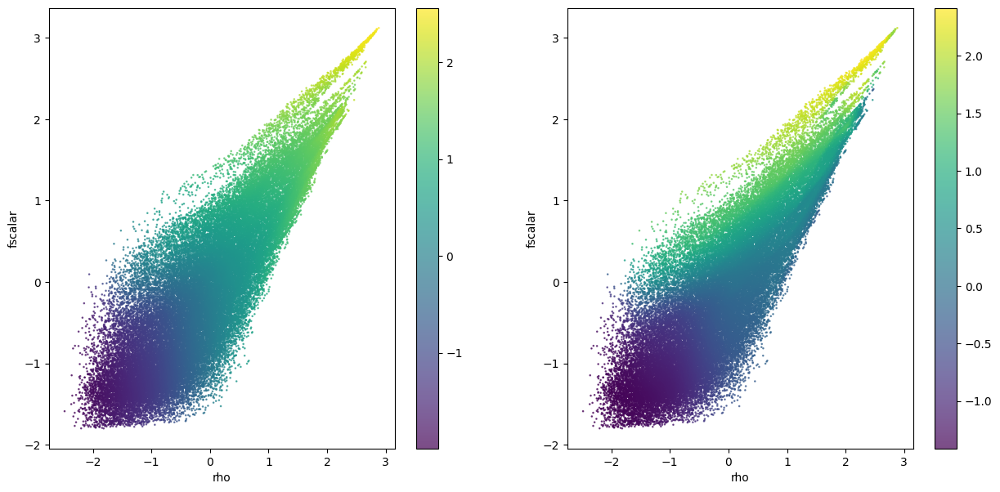

In [18]:
plt.figure(figsize=[15,7])
plt.subplot(121)
sc1 = plt.scatter(x_test[:,0], x_test[:,1], c=pred[:,0], s=0.75,alpha=0.7)
plt.colorbar(sc1)
# scatter(pred[:,0], pred[:,1], c='red', s=0.75,alpha=0.7);
plt.xlabel('rho')
plt.ylabel('fscalar')
plt.subplot(122)
sc2 = plt.scatter(x_test[:,0], x_test[:,1], c=pred[:,1], s=0.75,alpha=0.7)
plt.colorbar(sc2)
plt.xlabel('rho')
plt.ylabel('fscalar')

In [19]:
# So, what happens if we try to make maps from this relation instead of the true one
preds = []
for i in tqdm.tqdm(range(len(data)//10000)):
  preds.append(model.apply(params, data[i*10000:(i+1)*10000,0:2]))
preds.append(model.apply(params, data[(i+1)*10000:,0:2]))
preds = jnp.concatenate(preds, axis=0)

100%|██████████| 1595/1595 [00:23<00:00, 66.65it/s]


In [20]:
# Inverting the normalisation
preds = output_scaler.inverse_transform(preds)

Text(0.5, 1.0, 'ML Table Gas Temperature')

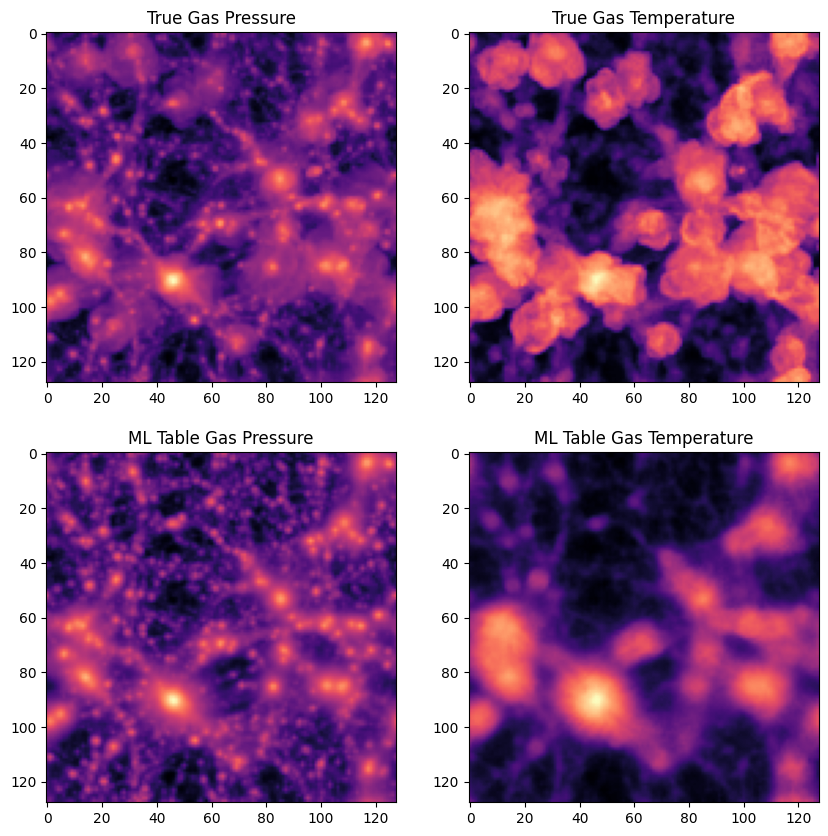

In [21]:
plt.figure(figsize=[10,10])
plt.subplot(221)
im1 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_P/hydro_gas_rho).sum(axis=0)), cmap='magma')
# plt.colorbar(im1)
plt.title('True Gas Pressure')
plt.subplot(222)
im2 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_T/hydro_gas_rho).sum(axis=0)), cmap='magma')
plt.title('True Gas Temperature')
plt.subplot(223)
im3 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, 10**preds[:,0]/hydro_gas_rho).sum(axis=0)), cmap='magma')
plt.title('ML Table Gas Pressure')
plt.subplot(224)
im4 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, 10**preds[:,1]/hydro_gas_rho).sum(axis=0)), cmap='magma')
plt.title('ML Table Gas Temperature')

In [22]:
# Let's try to identify the regions that are problematic
mask = (data[:,2] > 0. ) & (data[:,3] < -0.5 )

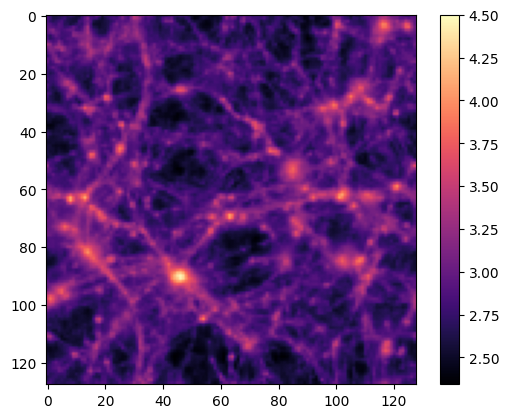

In [23]:
im1 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos[~mask]).sum(axis=0)), cmap='magma',vmax=4.5)
plt.colorbar(im1)

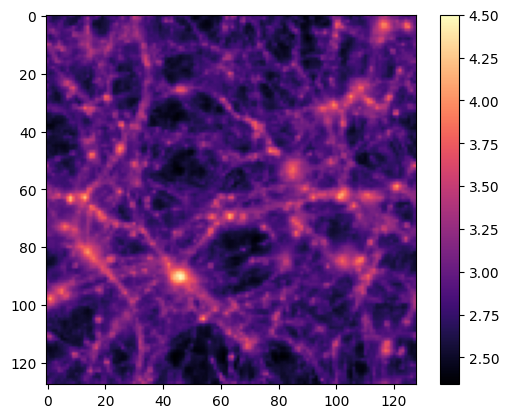

In [24]:
im1 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos).sum(axis=0)), cmap='magma',vmax=4.5)
plt.colorbar(im1)

## Now trying to model this table probabilistically

In [25]:
import jax
import jax.numpy as jnp
from tensorflow_probability.substrates import jax as tfp
tfd = tfp.distributions
tfb = tfp.bijectors

def make_nvp_fn(condition, n_layers=5, d=2):

  class AffineCoupling(nn.Module):
    
    @nn.compact
    def __call__(self, x, nunits):
      x = jnp.concatenate([x, condition], axis=-1)
      net = nn.leaky_relu(nn.Dense(256)(x))
      net = nn.leaky_relu(nn.Dense(256)(net))

      # Shift and scale parameters
      shift = nn.Dense(nunits)(net)
      scale = nn.softplus(nn.Dense(nunits)(net)) + 1e-3 # For numerical stability

      return  tfb.Chain([ tfb.Shift(shift), tfb.Scale(scale)])


  # We alternate between permutations and flow layers
  layers = [ tfb.Permute([1,0])(tfb.RealNVP(d//2, 
                                            bijector_fn=AffineCoupling(name='affine%d'%i)))
            for i in range(n_layers) ]

  # We build the actual nvp from these bijectors and a standard Gaussian distribution
  nvp = tfd.TransformedDistribution(
              # tfd.MultivariateNormalDiag(loc=jnp.zeros(2), scale_identity_multiplier=1.),
              tfd.MultivariateNormalDiag(loc=jnp.zeros(2)),
              bijector=tfb.Chain(layers))
  return nvp

2024-11-11 17:22:16.562592: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [26]:
class NeuralSplineFlowLogProb(nn.Module):
  @nn.compact
  def __call__(self,  x, condition):
    nvp = make_nvp_fn(condition)
    return nvp.log_prob(x)

class NeuralSplineFlowSampler(nn.Module):
  @nn.compact
  def __call__(self,  key, n_samples, condition):
    nvp = make_nvp_fn(condition)
    return nvp.sample(n_samples, seed=key)

In [27]:
model = NeuralSplineFlowLogProb()

# Random seed for initializaing network and sampling training data
seed = jax.random.PRNGKey(42)

# Initializes the weights of the model
params = model.init(seed, jnp.zeros((1,2)), jnp.zeros((1,2)))

# Define a scheduler for the leaerning rate
total_steps = 100_000
lr_scheduler = optax.piecewise_constant_schedule(init_value=0.0005,
                  boundaries_and_scales={int(total_steps*0.2):0.5,
                                         int(total_steps*0.5):0.5,
                                         int(total_steps*0.75):0.5})

# Initializes an optimizer and optimizer state
optimizer = optax.adam(learning_rate=lr_scheduler)
opt_state = optimizer.init(params)


# summary_writer = tensorboard.SummaryWriter('logs/nll2')

In [28]:
def loss_fn(params, x, condition):
  return - jnp.mean( model.apply(params, x, condition) )

@jax.jit
def update_model(params,  opt_state, x, condition):

  # Computes the gradients of the model
  loss, grads = jax.value_and_grad(loss_fn)(params, x, condition)

  # Computes the weights updates and apply them
  updates, opt_state = optimizer.update(grads, opt_state)
  params = optax.apply_updates(params, updates)

  return params, opt_state, loss

In [29]:
for i in tqdm.tqdm(range(total_steps)):
  inds = np.random.choice(len(data), 1024)
  
  # Apply the update function
  params, opt_state, loss = update_model(params, opt_state, data[inds,2:], data[inds,0:2])
  # Periodically exporting the value of the loss function, every 100 steps
  # if i %100 ==0:
  #    summary_writer.scalar('train_loss', loss, i)
  #    summary_writer.scalar('learning_rate', lr_scheduler(i), i)

100%|██████████| 100000/100000 [02:05<00:00, 797.78it/s]


In [30]:
sampler = NeuralSplineFlowSampler()

In [31]:
# Let's test on the remaining examples
inds = np.random.choice(len(data), 50000)
x_test = data[inds,0:2]
y_test = data[inds,2:]
pred = sampler.apply(params, jax.random.PRNGKey(0), 50000, x_test)

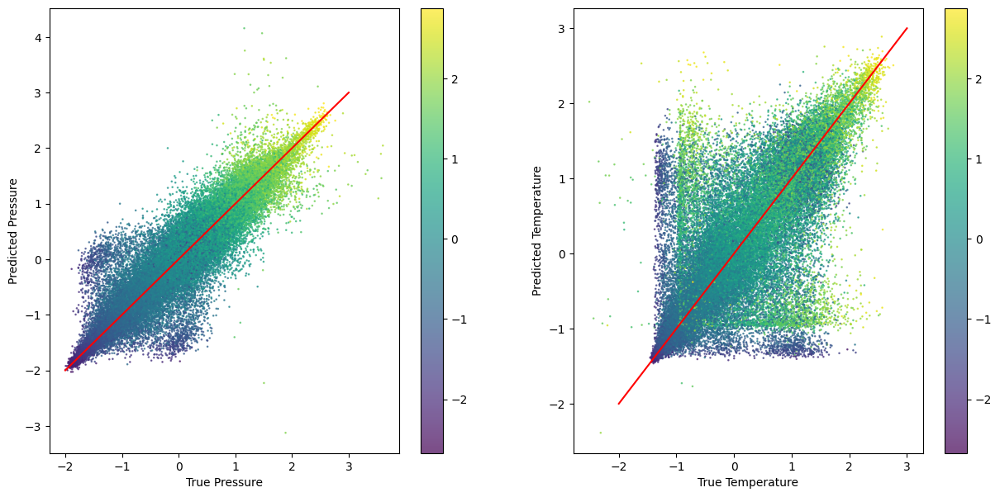

In [32]:
plt.figure(figsize=[15,7])
plt.subplot(121)
sc1 = plt.scatter(y_test[:,0], pred[:,0], c=x_test[:,0], s=0.75,alpha=0.7)
plt.colorbar(sc1)
plt.xlabel('True Pressure')
plt.ylabel('Predicted Pressure')
plt.plot([-2,3],[-2,3],color='r')
plt.subplot(122)
sc2 = plt.scatter(y_test[:,1], pred[:,1], c=x_test[:,0], s=0.75,alpha=0.7)
plt.colorbar(sc2)
plt.xlabel('True Temperature')
plt.ylabel('Predicted Temperature')
plt.plot([-2,3],[-2,3],color='r')

(-2.5, 3.0)

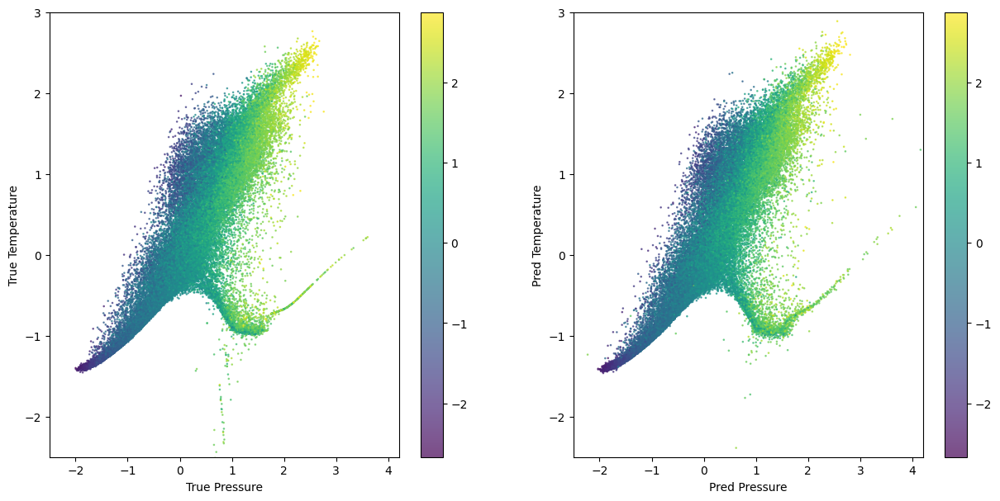

In [33]:
plt.figure(figsize=[15,7])
plt.subplot(121)
sc1 = plt.scatter(y_test[:,0], y_test[:,1], c=x_test[:,0], s=0.75,alpha=0.7)
plt.colorbar(sc1)
# scatter(pred[:,0], pred[:,1], c='red', s=0.75,alpha=0.7);
plt.xlabel('True Pressure')
plt.ylabel('True Temperature')
plt.xlim(-2.5, 4.2)
plt.ylim(-2.5, 3)
plt.subplot(122)
sc2 = plt.scatter(pred[:,0], pred[:,1], c=x_test[:,0], s=0.75,alpha=0.7)
plt.colorbar(sc2)
plt.xlabel('Pred Pressure')
plt.ylabel('Pred Temperature')
plt.xlim(-2.5, 4.2)
plt.ylim(-2.5, 3)

In [34]:
# So, what happens if we try to make maps from this relation instead of the true one
preds = []
key = jax.random.PRNGKey(0)
for i in tqdm.tqdm(range(len(data)//50000)):
  preds.append(sampler.apply(params,seed, 50000, data[i*50000:(i+1)*50000,0:2]))
  key, seed = jax.random.split(key)
preds.append(sampler.apply(params,seed, len(data) - (i+1)*50000, data[(i+1)*50000:,0:2]))
preds = jnp.concatenate(preds, axis=0)

100%|██████████| 319/319 [00:45<00:00,  7.08it/s]


In [35]:
# Inverting the normalisation
preds = output_scaler.inverse_transform(preds)

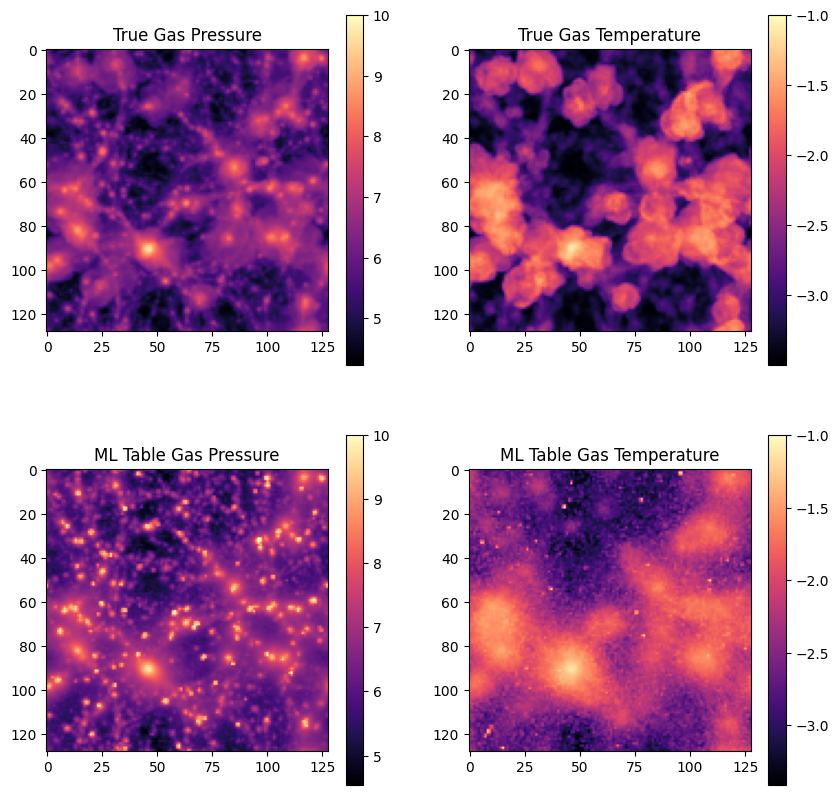

In [36]:
plt.figure(figsize=[10,10])
plt.subplot(221)
im1 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_P/hydro_gas_rho).sum(axis=0)), cmap='magma',vmax=10)
plt.colorbar(im1)
plt.title('True Gas Pressure');
plt.subplot(222)
im2 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, hydro_gas_T/hydro_gas_rho).sum(axis=0)), cmap='magma',vmax=-1)
plt.colorbar(im2)
plt.title('True Gas Temperature');
plt.subplot(223)
im3 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, 10**np.clip(preds[:,0],10,22)/hydro_gas_rho).sum(axis=0)), cmap='magma',vmax=10)
plt.colorbar(im3)
plt.title('ML Table Gas Pressure');
plt.subplot(224)
im4 = plt.imshow(np.log10(cic_paint(jnp.zeros(mesh_shape), hydro_gas_pos, 10**np.clip(preds[:,1],0,8)/hydro_gas_rho).sum(axis=0)), cmap='magma',vmax=-1)
plt.colorbar(im4)
plt.title('ML Table Gas Temperature');

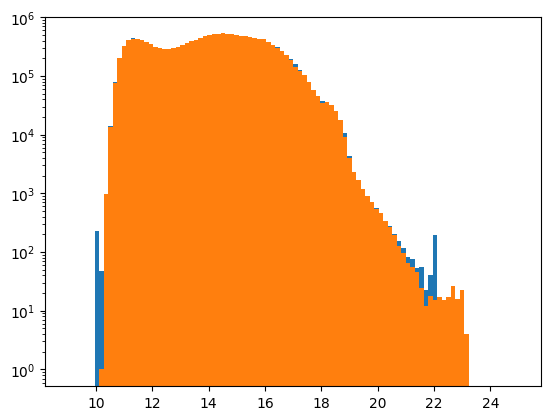

In [37]:
plt.hist(np.clip(preds[:,0],10,22), 100, range=[9,25]);
plt.hist(data_scaler.inverse_transform(data)[:,2], 100, range=[9,25])
plt.yscale('log')

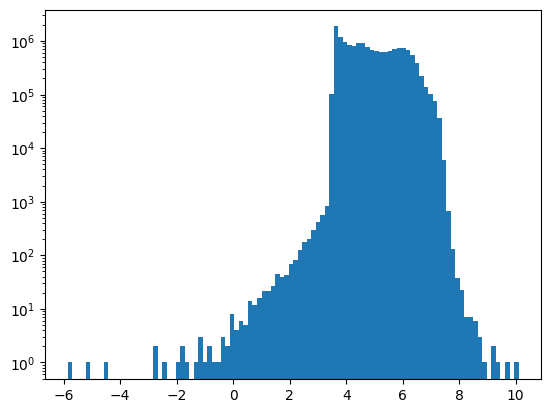

In [38]:
plt.hist(preds[:,1],100);
plt.yscale('log')

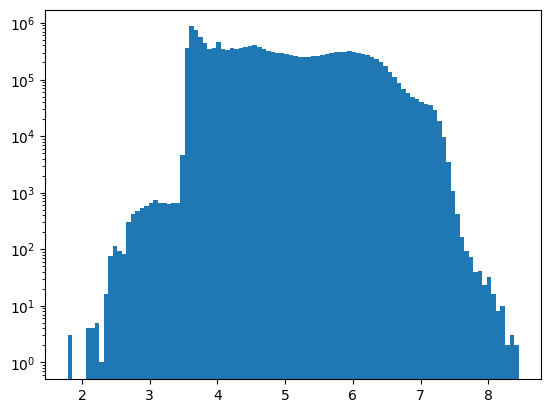

In [39]:
plt.hist(data_scaler.inverse_transform(data)[:,3], 100);
plt.yscale('log')